# Optimization methods homework 1

##### Import numpy and matplotlib

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300
plt.rcParams["figure.figsize"] = (20,10)
from matplotlib import style
style.use('ggplot')

### Задание 1

##### Реализуйте градиентный спуск с постоянным шагом (learning rate). Исследовать сходимость при различных значениях шага.

---

##### Мы будем использовать унимодальную функцию в качестве примера. Так как функция несложная, можно считать ее градиент точно.

In [2]:
def f(x, y):
  return (x - 5)**2 + (y * 0.5)**2

def grad(x, y):
  return [2 * (x - 5), 0.5 * y]

##### Разметим точки на плоскости, на которых будем искать минимум и построим график поверхности нашей функции

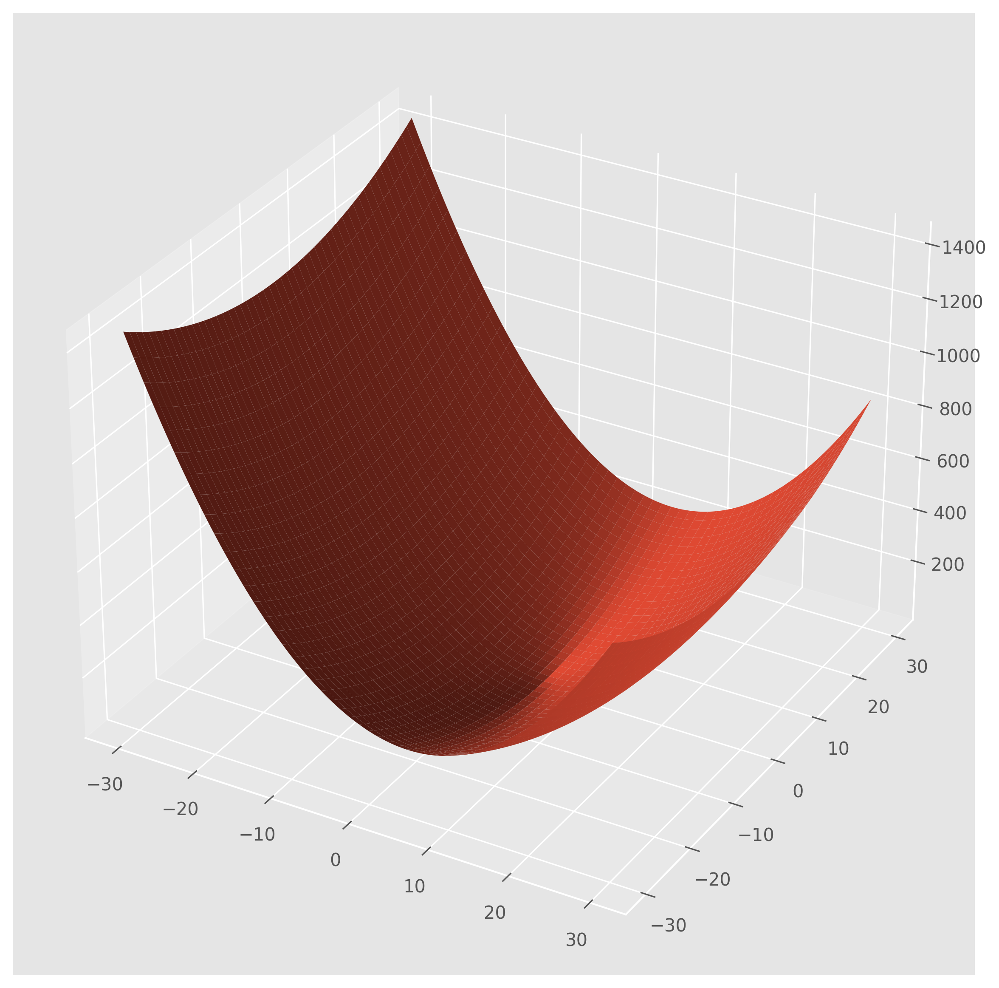

In [3]:
t = np.linspace(-30, 30, 1000)
X, Y = np.meshgrid(t, t)

ax = plt.figure().add_subplot(projection='3d')
ax.plot_surface(X, Y, f(X, Y))
plt.show()

##### Теперь реализуем градиентный спуск с постоянным шагом, задаваемым переменной, и посмотрим на сходимость метода в зависимости от разного learning rate.

In [4]:
initial_point = [20, 20]
iterations_count = 100


def grad_descent(learning_rate, iterations, initial_point, grad):
  points = np.zeros((iterations, 2))
  points[0] = initial_point

  for i in range(1, iterations):
    prev_point = points[i - 1]
    points[i] = prev_point - learning_rate * np.array(grad(*prev_point))
  return points


learning_rates = [0.01, 0.05, 0.1, 0.15, 0.2, 0.5, 1]
results = []

best_convergence_sequence = []
f_minimum = np.Inf

for lr in learning_rates:
  points = grad_descent(lr, iterations_count, initial_point, grad)
  result = f(*points[-1])
  results.append(result)
  
  if result < f_minimum:
    best_convergence_sequence = points
    f_minimum = result

##### Построим график с результатами метода

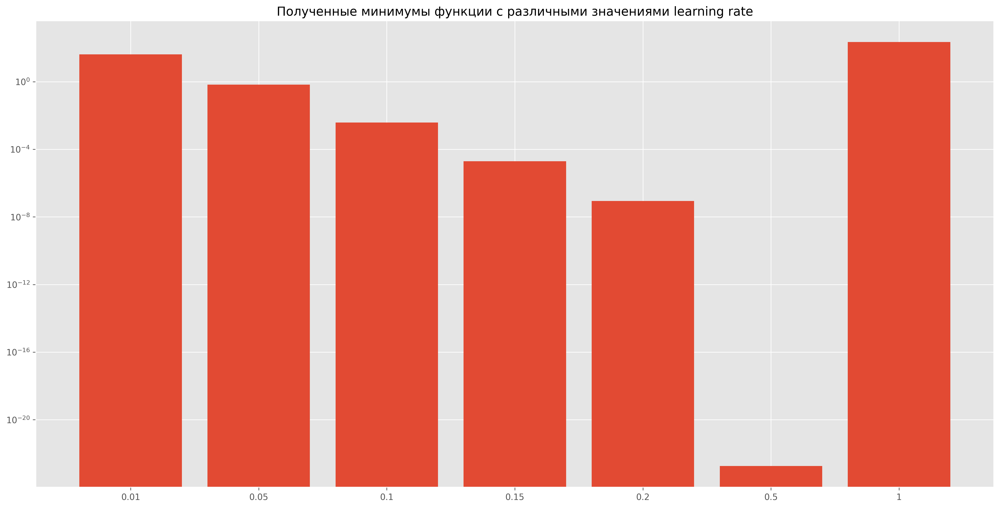

In [5]:
fig, ax = plt.subplots()
ax.set_title('Полученные минимумы функции с различными значениями learning rate', color='black')
ax.set_yscale('log') # logarithmic scale because lr=1 is too big

ax.bar([str(i) for i in learning_rates], results)
plt.show()

##### Как можно заметить, из всех испробованных learning rate наилучшим для схождения метода из точки (20, 20) с 100 итерациями оказалось значение 0.5 (а при lr=1 мы видим расхождение градиентного спуска)

##### Ниже выведем полученное значение минимума и то, как метод приближался к нему

In [6]:
print(f_minimum)
print(best_convergence_sequence[::5])

min_point = best_convergence_sequence[-1]
print('x_min, y_min: ', min_point)

1.8286481525183785e-23
[[2.00000000e+01 2.00000000e+01]
 [5.00000000e+00 4.74609375e+00]
 [5.00000000e+00 1.12627029e+00]
 [5.00000000e+00 2.67269220e-01]
 [5.00000000e+00 6.34242388e-02]
 [5.00000000e+00 1.50508692e-02]
 [5.00000000e+00 3.57164180e-03]
 [5.00000000e+00 8.47567342e-04]
 [5.00000000e+00 2.01131703e-04]
 [5.00000000e+00 4.77294960e-05]
 [5.00000000e+00 1.13264331e-05]
 [5.00000000e+00 2.68781567e-06]
 [5.00000000e+00 6.37831259e-07]
 [5.00000000e+00 1.51360347e-07]
 [5.00000000e+00 3.59185200e-08]
 [5.00000000e+00 8.52363316e-09]
 [5.00000000e+00 2.02269810e-09]
 [5.00000000e+00 4.79995741e-10]
 [5.00000000e+00 1.13905239e-10]
 [5.00000000e+00 2.70302472e-11]]
x_min, y_min:  [5.00000000e+00 8.55253916e-12]


##### И действительно, минимум функции находится в точке (5, 0)

### Задание 2

##### Подберите функцию изменения шага (learning rate scheduling), чтобы улучшить сходимость. Например, экспоненциальную или ступенчатую.

---

##### Разработаем экпоненциальную функцию (зависимость от номера текущей итерации и количества всех итераций). Не будем брать предыдущий результат (lr=0.5), а подберем дополнительно наилучшее первоначальное значение.

In [7]:
initial_lr_exp = 2.5

def exp_learning_rate(epoch):
  exp_lr_reducing_coeff = iterations_count / 5
  return np.e**(np.log(initial_lr_exp) - epoch / exp_lr_reducing_coeff)

##### И похожим образом зададим линейную функцию (не ступенчатую! ведь нам дают свободу выбора).

In [8]:
initial_lr_linear = 1.2

def linear_learning_rate(epoch) :
  m_max = iterations_count
  step = initial_lr_linear / (m_max + 1)
  return initial_lr_linear - step * epoch

##### Нарисуем графики функций шага

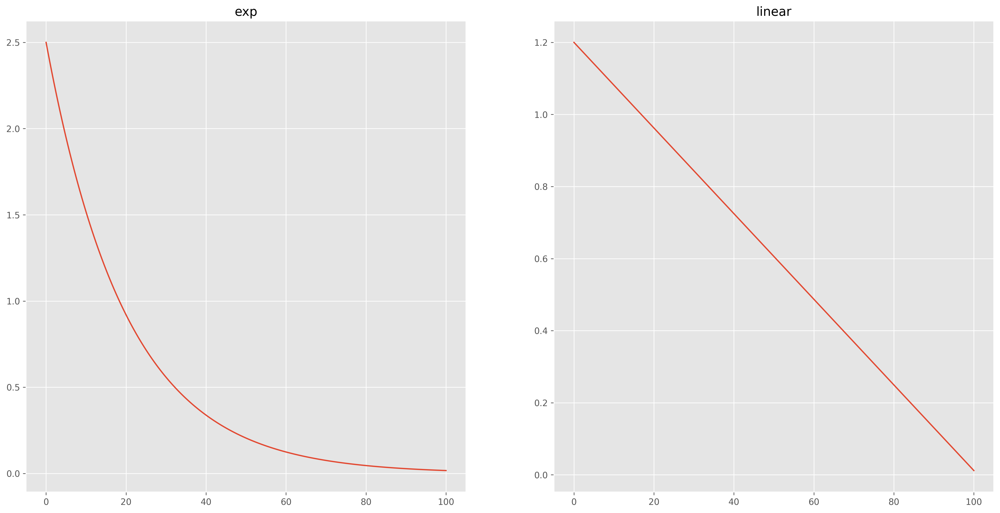

In [9]:
x = np.linspace(0, iterations_count, 1000)
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.plot(x, [exp_learning_rate(i) for i in x])
ax1.set_title('exp', color='black')

ax2.plot(x, [linear_learning_rate(i) for i in x])
ax2.set_title('linear', color='black')
plt.show()

##### Теперь модифицируем функцию градиентного спуска для использования только что созданных learning rate schedulers и вызовем ее с экспоненциальной и линейной функциями изменения шага. Сравним новые результаты с предыдущим запуском.

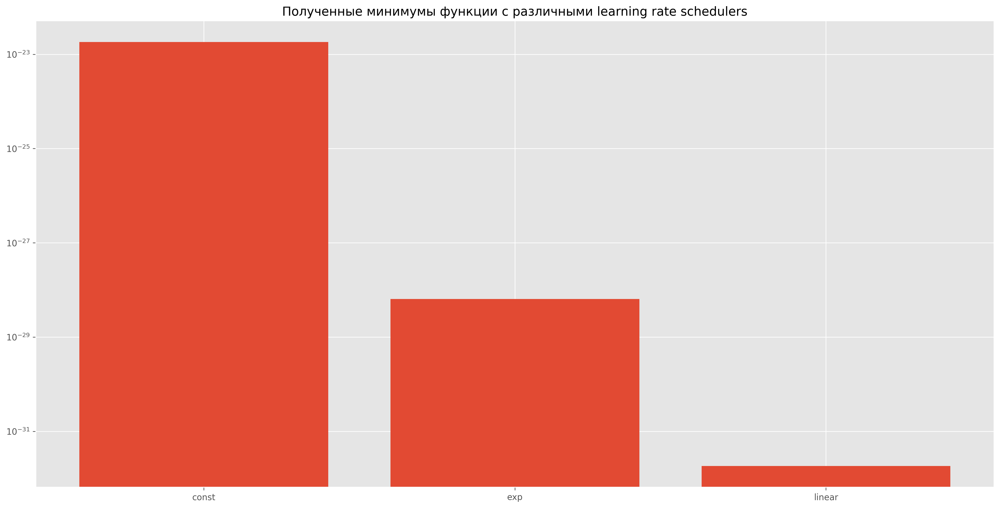

In [10]:
def grad_descent(lr_scheduler, iterations, initial_point, grad):
  points = np.zeros((iterations, 2))
  points[0] = initial_point

  for i in range(1, iterations):
    prev_point = points[i - 1]
    points[i] = prev_point - lr_scheduler(i) * np.array(grad(*prev_point))
  return points

points_exp = grad_descent(exp_learning_rate, iterations_count, initial_point, grad)
points_linear = grad_descent(linear_learning_rate, iterations_count, initial_point, grad)

fig, ax = plt.subplots()
ax.set_title('Полученные минимумы функции с различными learning rate schedulers', color='black')
ax.set_yscale('log') # logarithmic scale

ax.bar(['const', 'exp', 'linear'], [
  f_minimum,
  f(*points_exp[-1]),
  f(*points_linear[-1])])
plt.show()

##### Как можно заметить, использование learning rate schedulers может заметно улучшить сходимость метода градиентного спуска. Для данной функции (а также данных начальной точки и количества итераций) наилучшим оказался метод линейного изменения шага.

##### Однако, внимание, при увеличении количества итераций, экспоненциальная функция изменения шага даст намного более лучшую сходимость. Для полноты мы покажем, что это правда (но если, к примеру, высокая точность не нужна, то зачем платить больше?)

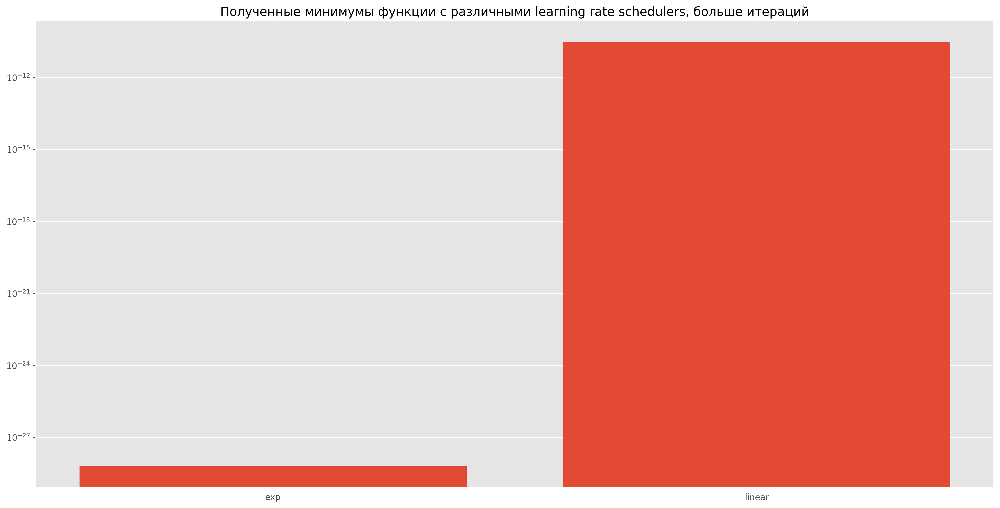

In [11]:
#iterations_count = 100 # before
huge_iterations_count = 200 # after

def huge_comparison():
    points_exp = grad_descent(exp_learning_rate, huge_iterations_count, initial_point, grad)
    points_linear = grad_descent(linear_learning_rate, huge_iterations_count, initial_point, grad)

    fig, ax = plt.subplots()
    ax.set_title('Полученные минимумы функции с различными learning rate schedulers, больше итераций', color='black')
    ax.set_yscale('log') # logarithmic scale because lr=1 is too big

    ax.bar(['exp', 'linear'], [
     f(*points_exp[-1]),
     f(*points_linear[-1])])
    plt.show()

huge_comparison()

##### Таким образом, выбор наилучшей функции изменения шага может зависеть и от количества итераций.

### Задание 3

##### Реализовать какой-нибудь метод одномерного поиска (дихотомии, метод Фибоначчи, метод золотого сечения) и градиентный спуск на его основе. Сравнить эффективность с точки зрения количества вычислений минимизируемой функции и ее градиентов.

---

##### Модифицируем градиентный спуск поиском оптимального learning rate с помощью дихотомии

In [13]:
def hybrid_method(initial_point, iterations, f, grad):
    x = np.array(initial_point)
    eps = 1e-7
    points = []

    approximation_resolution = 5e-2

    for i in range(1, iterations):
        points.append(x)
        gradient = np.array(grad(*x))

        l = 1e-10 # min learning rate
        r = 2 # max learning rate

        while r - l > approximation_resolution:
            lr1 = (l + r) / 2 - eps
            lr2 = (l + r) / 2 + eps

            c1 = x - lr1 * gradient
            c2 = x - lr2 * gradient

            f_c1 = f(c1[0], c1[1])
            f_c2 = f(c2[0], c2[1])

            if f_c1 <= f_c2:
                r = lr2
            else:
                l = lr1
        
        x = x - l * gradient

    points.append(x)
    return np.array(points)

points_hybrid = hybrid_method(initial_point, iterations_count, f, grad)

##### Нарисуем графики сходимости гибридного метода (дихотомия и использование градиента) и метода с использованием линейного learning rate scheduler (наилучший из предыдущих результатов)

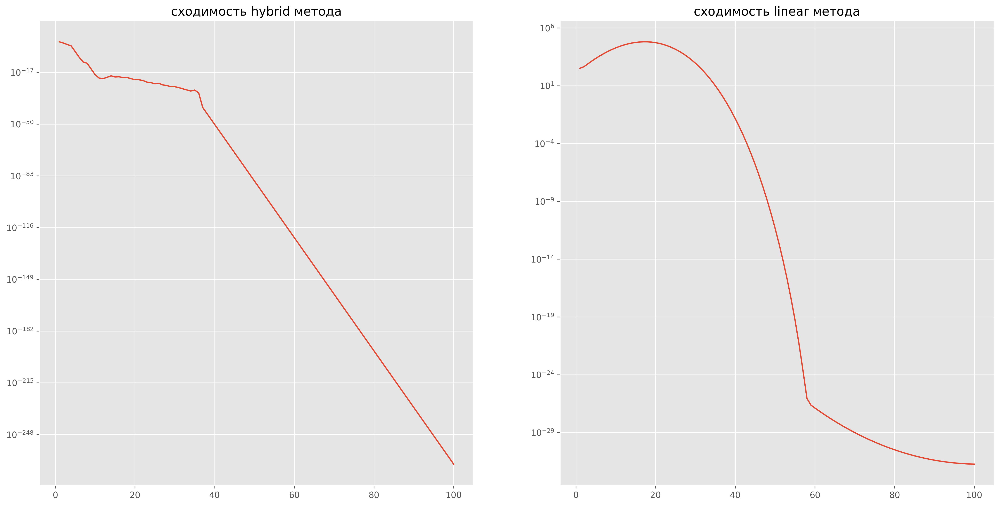

In [14]:
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.plot(np.arange(1, iterations_count + 1), [f(*p) for p in points_hybrid])
ax1.set_yscale('log') # logarithmic scale
ax1.set_title('сходимость hybrid метода', color='black')

ax2.plot(np.arange(1, iterations_count + 1), [f(*p) for p in points_linear])
ax2.set_yscale('log') # logarithmic scale
ax2.set_title('сходимость linear метода', color='black')

plt.show()

##### Заметим, что за одну итерацию гибридный метод вычисляет функцию примерно 20 раз и 1 раз градиент, а градиентный спуск с линейным изменением learning rate вычисляет градиент только 1 раз и не вычисляет функцию вовсе. Это означает, что первый метод "тяжелее" для вычисления. Однако этот серьезный сбор информации на исследуемом отрезке и позволяет гибридному методу показывать намного более лучшие результаты сходимости на графике выше.

##### Мы модифицировали градиентный спуск с помощью дихотомии (осуществляя подбор оптимального learning rate), суть которой заключается в делении исследуемого отрезка пополам, то есть число итераций для поиска оптимального learning rate составляет примерно `log2((r - l) / approximation_resolution)`.

##### В дополнение: количество вычислений функции в гибридном методе можно уменьшить в два раза, если применить золотое сечение, однако за меньшее количество вызовов мы заплатим большим числом итераций для подбора learning rate с той же точностью. Почему?

##### Метод дихотомии, как уже было сказано, делит отрезок пополам, то есть имеет log_2 асимптотику, а метод золотого сечения делит отрезок на ~1.6, из-за чего асимптотика будет log_1.5, но это лишь значит, что золотое сечение "проигрывает" дихотомии по количеству итераций в константное число раз, поэтому метод золотого сечения использовать в любом случае выгоднее.

### Задание 5.

##### Проанализируйте траекторию градиентного спуска для нескольких квадратичных функций: придумайте две-три квадратичные двумерные функции, на которых работа метода будет отличаться, нарисуйте графики с линиями уровня функций и траекториями методов.

##### Попробуйте ответить на следующий вопрос: как отличается поведение метода в зависимости от выбора начальной точки и стратегии выбора шага?

---

##### Придумаем две функции и построим их поверхности.

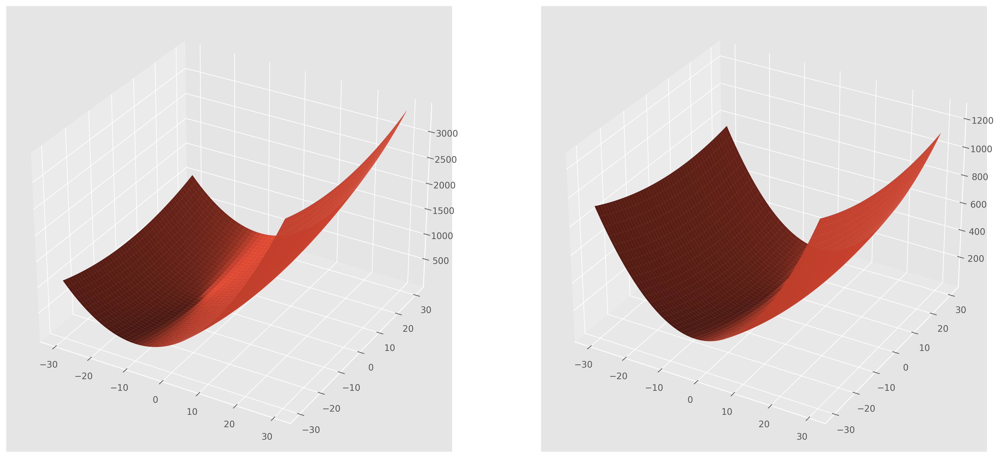

In [18]:
def fun1(x, y):
    return (2 * (x+10)**2 + 0.3 * y**2)

def fun1_grad(x, y):
    return [4 * x + 40, 0.6 * y]

def fun2(x, y):
    return (x + 3)**2 + 0.11 * (y - 12)**2

def fun2_grad(x, y):
    return [2 * x + 6, 0.22 * y - 2.64]


t = np.linspace(-30, 30, 1000)
X, Y = np.meshgrid(t, t)

fig = plt.figure()

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(X, Y, fun1(X, Y))

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X, Y, fun2(X, Y))

plt.show()

##### Запустим градиентный спуск на первой функции с линейным методом изменения шага и гибридный градиентный спуск, построим траектории и контуры.

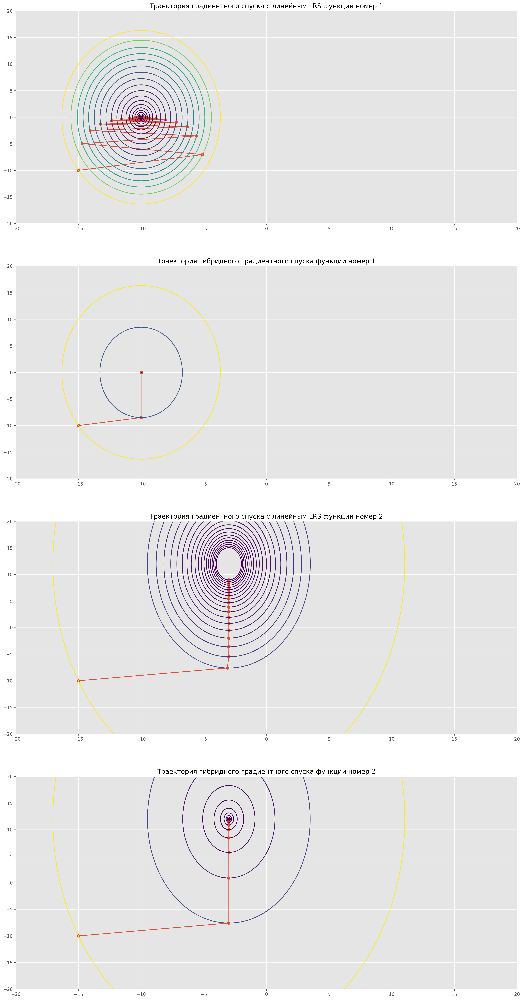

In [20]:
# backup vars
tmp_lr = initial_lr_linear
tmp_ip = initial_point

t = np.linspace(-20, 20, 1000)
X, Y = np.meshgrid(t, t)


def draw_plot(ax, pts, f, method_name, fun_name):
    ax.plot(pts[:, 0], pts[:, 1], 'o-')
    ax.contour(X, Y, f(X, Y), levels=sorted([f(*p) for p in pts]))
    ax.set_title('Траектория {0} функции номер {1}'.format(method_name, fun_name), color='black')


def draw(initial_point, iterations_count, ax1, ax2, f, grad, f_name):
    points = grad_descent(linear_learning_rate, iterations_count, initial_point, grad)
    draw_plot(ax1, points, f, "градиентного спуска с линейным LRS", f_name)

    points = hybrid_method(initial_point, iterations_count, f, grad)
    draw_plot(ax2, points, f, "гибридного градиентного спуска", f_name)


fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1)
fig.set_size_inches(20, 40)

few_iterations_count = 20

initial_lr_linear = 0.5
initial_point = [-15, -10]

# function 1
draw(initial_point, few_iterations_count, ax1, ax2, fun1, fun1_grad, "1")

# function 2
draw(initial_point, few_iterations_count, ax3, ax4, fun2, fun2_grad, "2")

# restore vars
initial_lr_linear = tmp_lr
initial_point = tmp_ip

plt.show()

##### Гибридный метод имеет намного более лучшую сходимость, как уже было показано ранее.

##### Теперь рассмотрим сходимость в зависимости от выбора начальной точки.

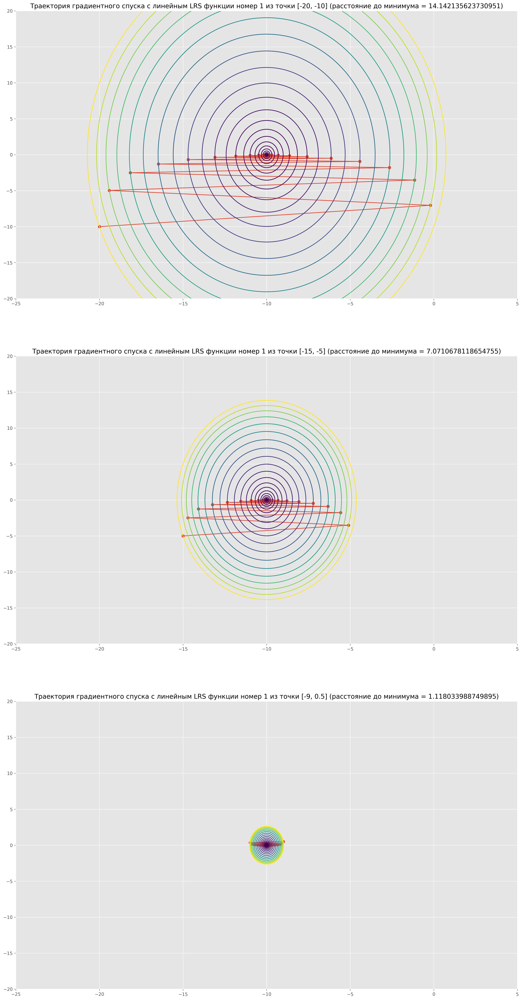

In [22]:
# backup vars
tmp_lr = initial_lr_linear


def draw_plot2(ax, pts, initial_point):
    dist = np.hypot(*(np.array([-10, 0]) - initial_point))
    draw_plot(ax, pts, fun1, "градиентного спуска с линейным LRS", "1 из точки {0} (расстояние до минимума = {1})".format(initial_point, dist))


fig, (ax1, ax2, ax3) = plt.subplots(3, 1)
fig.set_size_inches(20, 40)

initial_lr_linear = 0.5

X, Y = np.meshgrid(np.linspace(-25, 5, 1000), np.linspace(-20, 20, 1000))

initial_point1 = [-20, -10]
pts1 = grad_descent(linear_learning_rate, iterations_count, initial_point1, fun1_grad)
draw_plot2(ax1, pts1, initial_point1)

initial_point2 = [-15, -5]
pts2 = grad_descent(linear_learning_rate, iterations_count, initial_point2, fun1_grad)
draw_plot2(ax2, pts2, initial_point2)

initial_point3 = [-9, 0.5]
pts3 = grad_descent(linear_learning_rate, iterations_count, initial_point3, fun1_grad)
draw_plot2(ax3, pts3, initial_point3)

# restore vars
initial_lr_linear = tmp_lr

plt.show()

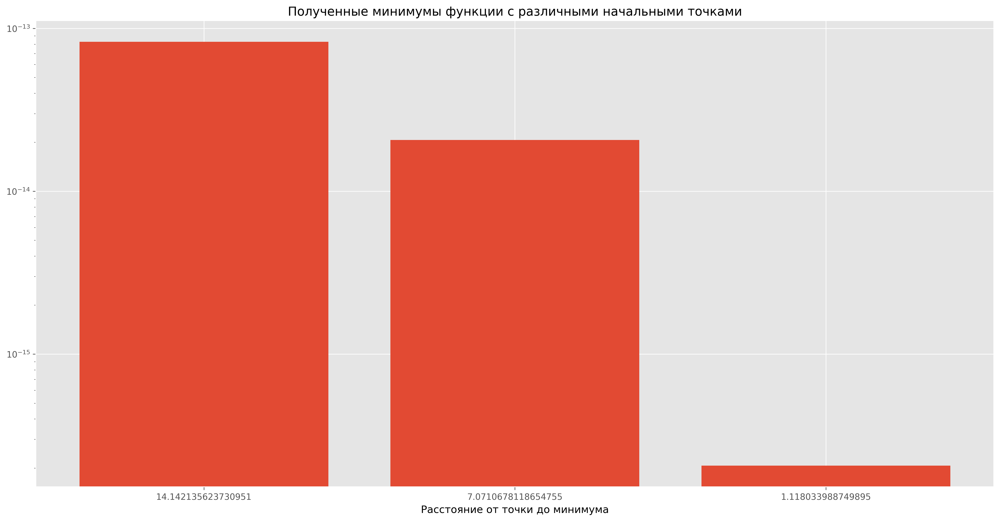

In [23]:
fig, ax = plt.subplots()
ax.set_title('Полученные минимумы функции с различными начальными точками', color='black')
ax.set_xlabel('Расстояние от точки до минимума', color='black')
ax.set_yscale('log') # logarithmic scale

ax.bar([str(np.hypot(*(np.array([-10, 0]) - p))) for p in [initial_point1, initial_point2, initial_point3]], [
  fun1(*pts1[-1]),
  fun1(*pts2[-1]),
  fun1(*pts3[-1])])

plt.show()

##### Мы сделаем вывод, что чем ближе к минимуму находится начальная точка (при условии, что learning rate мы подбираем, либо опираемся на его оптимальный выбор с помощью одномерного поиска), тем быстрее сходится метод

##### Если learning rate выбран неудачно, метод может как сходиться долго (зависит от стратегии выбора шага), так и расходиться вовсе.

### Задание 4*

##### Сделать одномерный поиск с учетом условий Вольфе и исследовать эффективность.

---

##### Запишем сами условия Вольфе

In [24]:
def first_cond(x_k, p_k, alpha, f, c_1=0.0001):
    return f(*(x_k + alpha * p_k)) <= f(*x_k) - c_1 * alpha * np.dot(p_k, p_k)


def second_cond(x_k, p_k, alpha, grad, c_2=0.9):
    return np.dot(grad(*(x_k + alpha * p_k)), p_k) >= - c_2 * np.dot(p_k, p_k)


##### Теперь реализуем градиентный спуск с подбором learning rate с помощью бинпоиска по условию Вольфе и запустим полученный метод на функции из задания 1 с той же точкой и тем же количеством итераций

In [25]:
def grad_descent_wolfe(initial_point, iterations, f, grad):
    x = np.array(initial_point)
    points = []

    approximation_resolution = 5e-2

    for i in range(1, iterations):
        points.append(x)
        gradient = np.array(grad(*x))

        l = 1e-10 # min learning rate
        r = 5 # max learning rate
        optimal = False

        while r - l > approximation_resolution:
            m = (l + r) / 2

            if not first_cond(x, -gradient, m, f): # big steps causes going away from minimums
                r = m
            elif not second_cond(x, -gradient, m, grad): # small steps prevents from moving confidently
                l = m
            else:
                optimal = m
                break
        
        if optimal == False:
            break # can't make a step

        x = x - optimal * gradient
    
    points.append(x)
    return np.array(points)


points_wolfe = grad_descent_wolfe(initial_point, iterations_count, f, grad)
print(points_wolfe[-1], len(points_wolfe))

[5.00000000e+00 8.22904255e-39] 100


##### Сравним сходимость между ранее использованным гибридным методом (оптимальный выбор learning rate с помощью дихотомии по минимуму функции на направлении) и новым методом (оптимальный выбор learning rate с помощью дихотомии по условиям Вольфе)

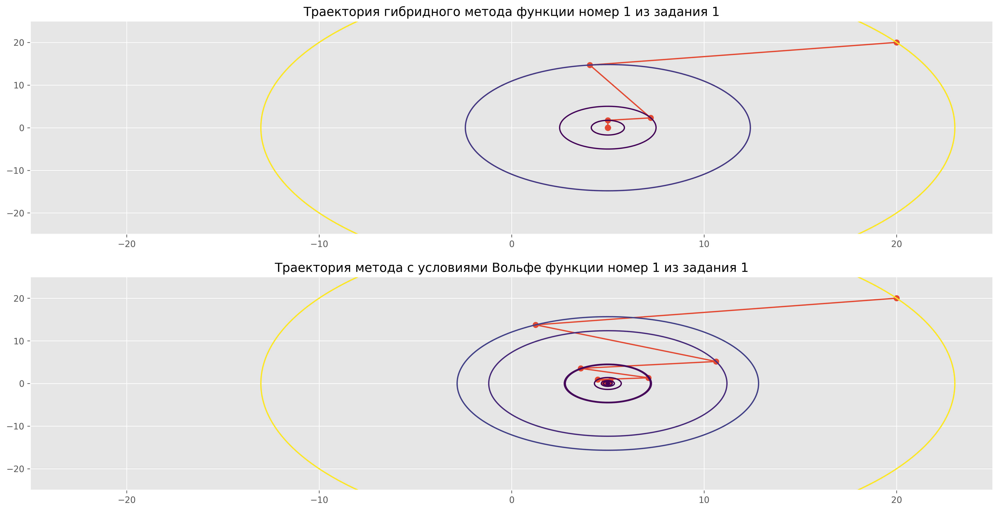

In [31]:
fig, (ax1, ax2) = plt.subplots(2, 1)

t = np.linspace(-25, 25, 1000)
X, Y = np.meshgrid(t, t)

draw_plot(ax1, points_hybrid, f, "гибридного метода", "1 из задания 1")
draw_plot(ax2, points_wolfe, f, "метода с условиями Вольфе", "1 из задания 1")

plt.show()

##### Видим, что метод, основанный только на условиях Вольфе сходится, но серьезно проигрывает в быстроте сходимости своему сопернику. Сравним полученные минимумы двух методов на логарифмической шкале.

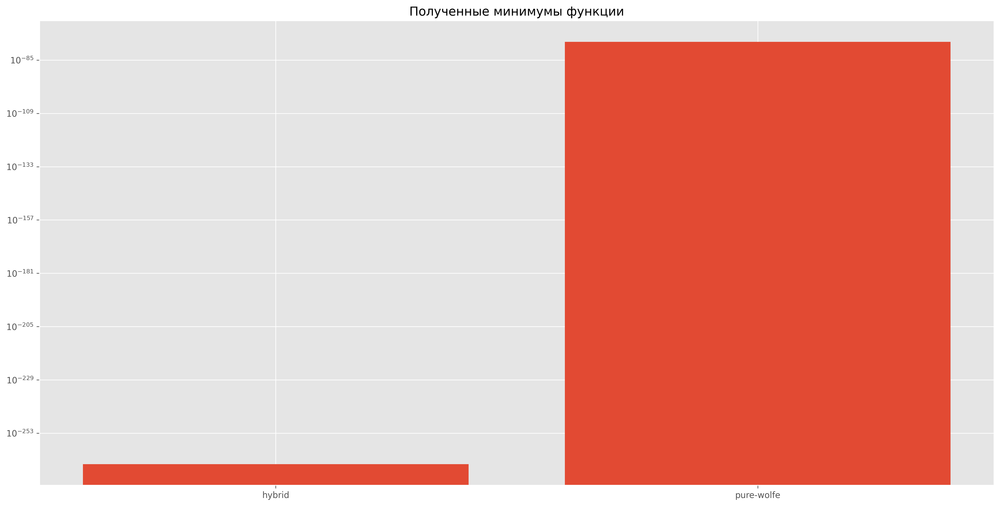

In [32]:
fig, ax = plt.subplots()
ax.set_title('Полученные минимумы функции', color='black')
ax.set_yscale('log') # logarithmic scale

ax.bar(["hybrid", "pure-wolfe"], [
  f(*points_hybrid[-1]),
  f(*points_wolfe[-1])])

plt.show()

### Задание 6

##### Исследуйте как зависит число итераций, необходимое градиентному спуску для сходимости, от следующих параметров:

##### (a) числа обусловленности k>=1 оптимизируемой функции

##### (b) размерности пространства n оптимизируемых переменных

##### Для этого для заданных параметров n и k сгенерируйте случайным образом квадратичную задачу размера n с числом обусловленности k и запустите на ней градиентный спуск с некоторой фиксированной требуемой точностью. Замерьте число итераций T(n, k), которое потребовалось сделать методу до сходимости (успешному выходу по критерию остановки).

---

##### Для начала найдем случайную матрицу, задающую квадратичную задачу для n = 3, k >= 1. Матричный вид нужен, чтобы посчитать число обусловленности.

##### Поверхность второго порядка задается следующим уравнением:

##### `X^T * A * X + 2 * B * X + C = 0`

##### Мы будем использовать небольшое допущение, опуская линейную часть уравнения. Это позволит легче считать число обусловленности и собственные числа.

##### `X^T * A * X = 0`

##### `X = [x, y, z]^T, A = матрица 3*3 (по трем переменным)`

##### Сгенерируем 30 кандидатов-матриц на рассмотрение и посчитаем их число обусловленности.

In [33]:
def get_matrix_and_cond():
    n = 3
    matrix = np.random.sample((n, n))
    return (matrix, np.linalg.cond(matrix))

task6_1 = []

for i in range(30):
    task6_1.append(get_matrix_and_cond())

task6_1.sort(key=lambda key: key[1])
print('числа обусловленности:')
print([r[1] for r in task6_1])

числа обусловленности:
[3.9117602150285085, 5.108177249651527, 5.369762046021543, 5.502175951440588, 5.54001126397581, 5.573826856473356, 5.834042019121244, 6.14905705715369, 6.231100247962999, 8.088985211153723, 8.586176154281594, 10.287528777521882, 11.486309958833305, 12.172278346005276, 12.336889788763303, 13.148689652514753, 14.737049986443347, 17.782448736218676, 18.788051624008133, 19.293028251047815, 25.143714223748532, 25.575175925788006, 34.23594090855381, 39.37065230933717, 50.472987610246, 50.57859001063876, 51.622455541046165, 52.7487337803484, 82.91791486596313, 368.1091707669809]


##### Теперь напишем функцию, которая считает z=f(x,y) при передаче ей матрицы А.

##### Заметим, что мы пользуемся допущением еще раз - имея матрицу A, привести уравнение `X^T * A * X = 0` из матричного вида в каноничный несложно: для этого найдем собственные числа матрицы А.

##### К несчастью, некоторые собственные числа могут оказаться комплексными (потому кандидатов и было 30), мы отберем не более 5 случайных кандидатов, чьи собственные числа вещественны и у которых образуемая плоскость не имеет разрывов (не существует координат x и y, по которым z выражается в поле комплексных чисел).

числа обусловленности:
[3.9117602150285085, 5.834042019121244, 10.287528777521882, 19.293028251047815, 52.7487337803484]


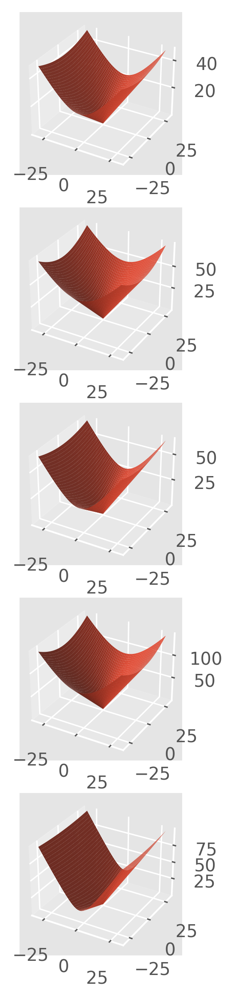

In [38]:
def task6_f(A, B, C, x, y):
    # A*x^2 + B*y^2 + C*z^2 = 0
    # z = +- sqrt(-A/C*x^2 - B/C*y^2)
    # assume, that z is positive
    return np.sqrt(-A/C * x**2 - B/C * y**2)


def task6_grad(A, B, C, x, y):
    f_z = task6_f(A, B, C, x, y)
    return [-A*x / (C * f_z), -B*y / (C * f_z)]


def task6_check(A, B, C):
    if isinstance(A, complex) or isinstance(B, complex) or isinstance(C, complex):
        return False
    return -A/C >= 0 and -B/C >= 0


def task6_check2(item):
    _, _, eigvals = item
    return task6_check(*eigvals)

# собственные числа
task6_2 = [(matrix, cond, np.linalg.eigvals(matrix)) for matrix, cond in task6_1]

# убрать плоскости с разрывом, оставить не более 5
task6_3 = list(filter(task6_check2, task6_2))
np.random.shuffle(task6_3)
task6_3 = sorted(task6_3[:5], key=lambda r: r[1])

print('числа обусловленности:')
print([r[1] for r in task6_3])

t = np.linspace(-30, 30, 1000)
X, Y = np.meshgrid(t, t)

fig = plt.figure()

for i in range(len(task6_3)):
    ax = fig.add_subplot(len(task6_3), 1, i + 1, projection='3d')
    ax.plot_surface(X, Y, task6_f(*task6_3[i][2], X, Y))

plt.show()

##### Теперь запустим метод на каждой функции-кандидате. Пусть максимальное число итераций равно 800, начальная точка (10, 10), а требуемая точность - 1e-5.

In [39]:
def hybrid_method2(initial_point, f, grad, coeffs):
    x = np.array(initial_point)
    f_x = np.Inf
    eps = 1e-8
    precision = 1e-5
    iterations = 0

    approximation_resolution = 1e-6

    while f_x > precision and iterations < 800:
        iterations += 1
        gradient = np.array(grad(*coeffs, *x))

        l = 1e-8 # min learning rate
        r = 2 # max learning rate

        while r - l > approximation_resolution:
            lr1 = (l + r) / 2 - eps
            lr2 = (l + r) / 2 + eps

            c1 = x - lr1 * gradient
            c2 = x - lr2 * gradient

            f_c1 = f(*coeffs, c1[0], c1[1])
            f_c2 = f(*coeffs, c2[0], c2[1])

            if f_c1 <= f_c2:
                r = lr2
                f_x = f_c1
            else:
                l = lr1
                f_x = f_c2
        
        x = x - l * gradient

    return (x, f_x, iterations)

convergence = []
new_initial_point = [10, 10]

for i in task6_3:
    convergence.append(hybrid_method2(new_initial_point, task6_f, task6_grad, i[2]))

for i in convergence:
    print(i[1], i[2])

3.2346736535746133e-06 16
2.364715855188862e-06 13
7.458286386583187e-06 24
5.374873459940261e-06 15
6.438400457756769e-06 113


##### Построим графики полученных минимумов в зависимости от числа обусловленности (результаты, полученные на предыдущем шаге)

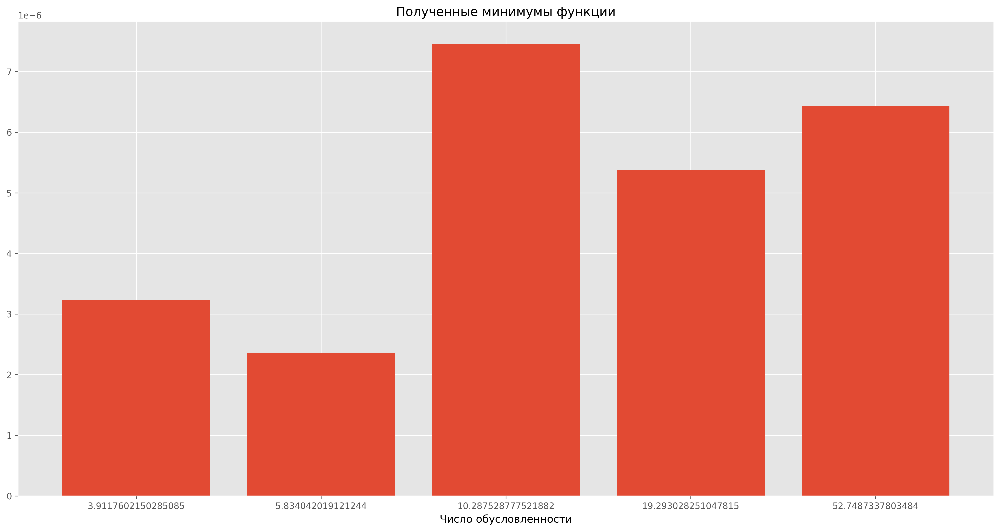

In [41]:
fig, ax = plt.subplots()
ax.set_title('Полученные минимумы функции', color='black')
ax.set_xlabel('Число обусловленности', color='black')
#ax.set_yscale('log') # logarithmic scale

ax.bar([str(i[1]) for i in task6_3], [i[1] for i in convergence])

plt.show()

##### Также построим графики зависимости числа итераций до требуемой точности в зависимости от числа обусловленности

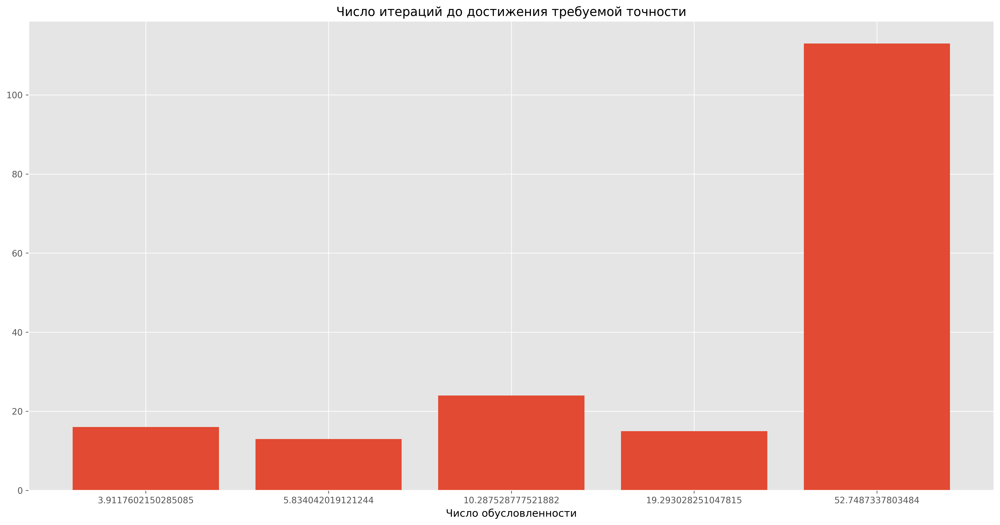

In [42]:
fig, ax = plt.subplots()
ax.set_title('Число итераций до достижения требуемой точности', color='black')
ax.set_xlabel('Число обусловленности', color='black')

ax.bar([str(i[1]) for i in task6_3], [i[2] for i in convergence])

plt.show()

##### По тому, что вид функции одинаков и количество кандидатов было невелико, однозначный вывод о влиянии числа обусловленности на сходимость метода составить нельзя, но если рассматривать именно те данные, что мы имеем, то можно предполагать, что на функциях с большим числом обусловленности сходимость метода будет более медленной.